In [1]:
!git clone https://github.com/brianadit24/neural_style_transfer_pytorch.git

Cloning into 'neural_style_transfer_pytorch'...
remote: Enumerating objects: 27, done.
remote: Counting objects: 100% (27/27), done.
remote: Compressing objects: 100% (20/20), done.
remote: Total 27 (delta 1), reused 27 (delta 1), pack-reused 0
Unpacking objects: 100% (27/27), done.


In [4]:
cd neural_style_transfer_pytorch

/content/neural_style_transfer_pytorch


In [5]:
import torch
from torch import optim

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device

device(type='cuda', index=0)

# Import Data

In [ ]:
from src.utils import load_image
from torchvision import transforms

In [7]:
CONTENT_PATH = "data/content/najwa.jpg"
STYLE_PATH = "data/style/Polygon.jpg"
 
transform = transforms.Compose([
    transforms.Resize(512),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])  
    
content = load_image(CONTENT_PATH, transform).to(device)
style = load_image(STYLE_PATH, transform).to(device)
 
output = load_image(CONTENT_PATH, transform).to(device)
output.requires_grad = True

# Training Preparation -> MCO

In [8]:
from src.model import NeuralStyleTransfer
from src.criterion import criterion

In [9]:
model = NeuralStyleTransfer().to(device)
optimizer = optim.AdamW([output], lr=0.05)

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


# Training

## Extract Fitur

Layer yang direkomendasikan
```
["4", "8", "13", "20", "27"]
```

In [10]:
content_features = model(content, layers=["4", "8"])
style_features = model(style, layers=["8", "13"])

## Training Loop

In [11]:
from src.utils import draw_styled_image

Epoch:   100 | Loss: 6.73807


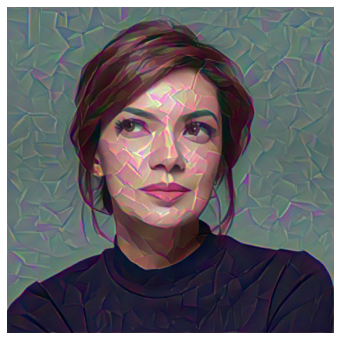

Epoch:   200 | Loss: 6.00208


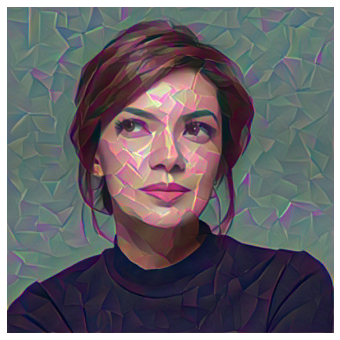

Epoch:   300 | Loss: 5.44523


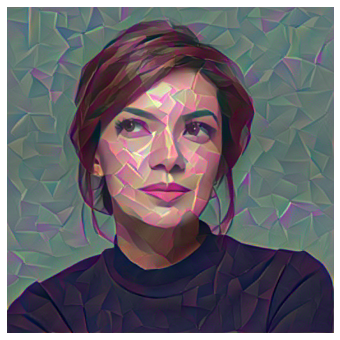

Epoch:   400 | Loss: 5.52203


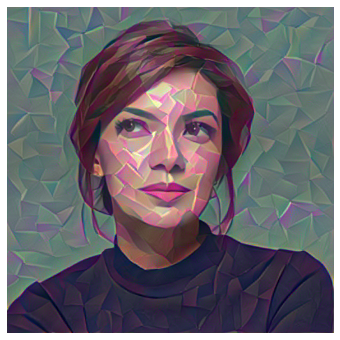

Epoch:   500 | Loss: 5.84975


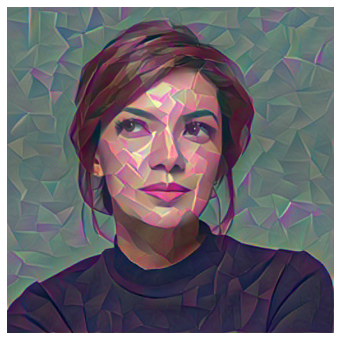

Epoch:   600 | Loss: 5.10730


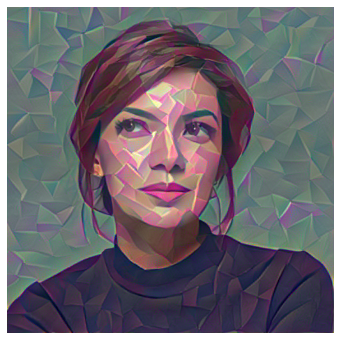

Epoch:   700 | Loss: 6.48362


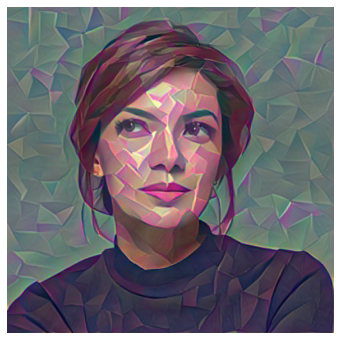

Epoch:   800 | Loss: 5.02184


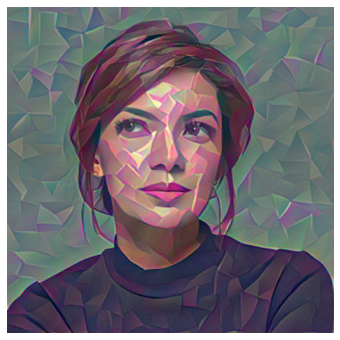

Epoch:   900 | Loss: 5.37338


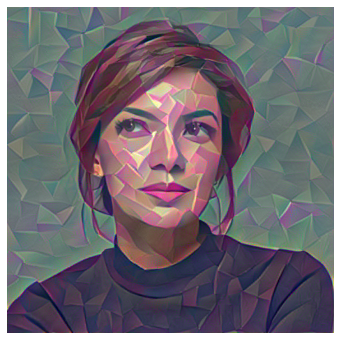

Epoch:  1000 | Loss: 5.30745


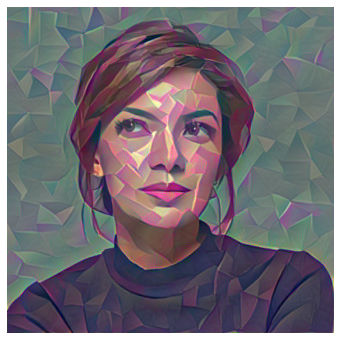

Epoch:  1100 | Loss: 5.01074


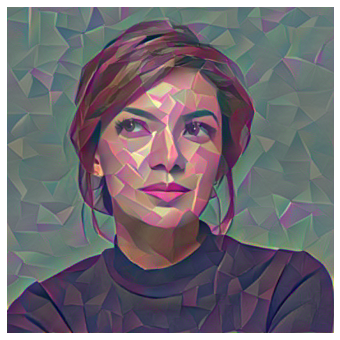

Epoch:  1200 | Loss: 5.78352


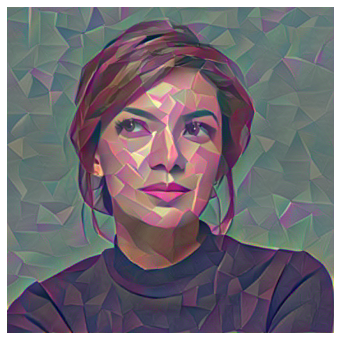

Epoch:  1300 | Loss: 4.79835


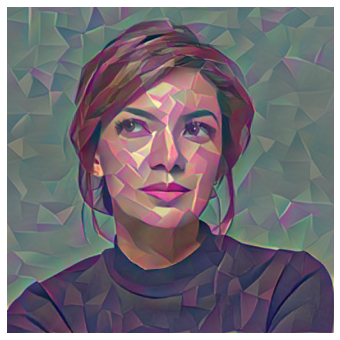

Epoch:  1400 | Loss: 6.63205


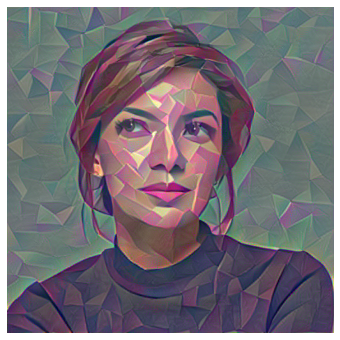

Epoch:  1500 | Loss: 4.86225


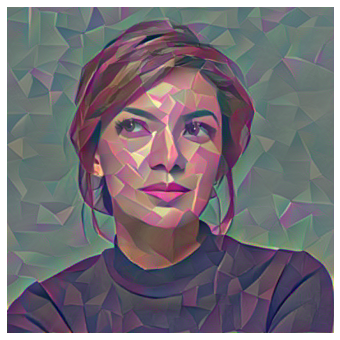

Epoch:  1600 | Loss: 5.85523


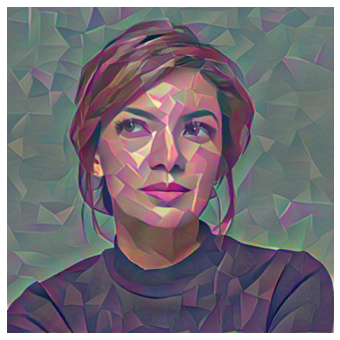

Epoch:  1700 | Loss: 4.94255


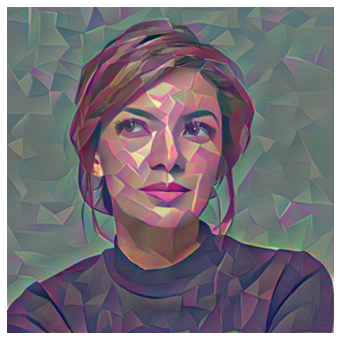

Epoch:  1800 | Loss: 5.38461


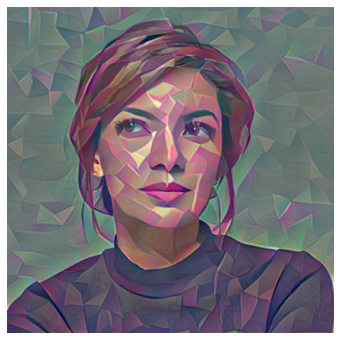

Epoch:  1900 | Loss: 4.96431


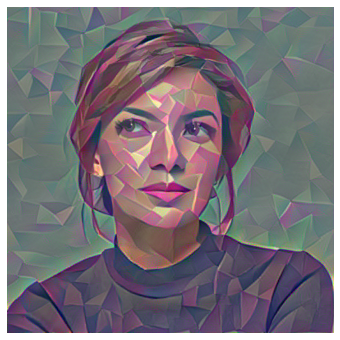

Epoch:  2000 | Loss: 5.36535


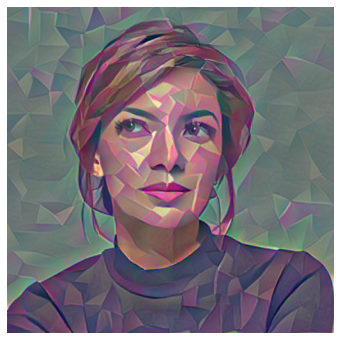

Epoch:  2100 | Loss: 5.01179


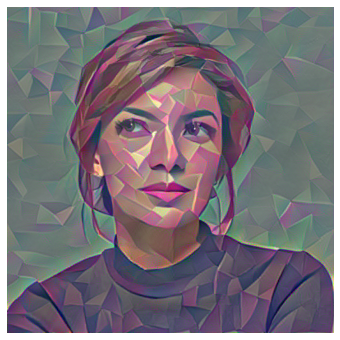

Epoch:  2200 | Loss: 5.00633


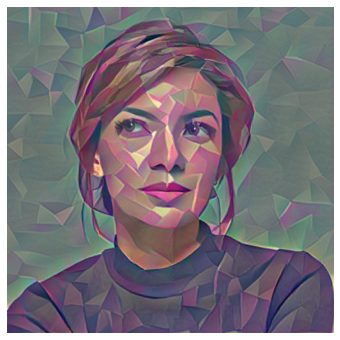

Epoch:  2300 | Loss: 5.13525


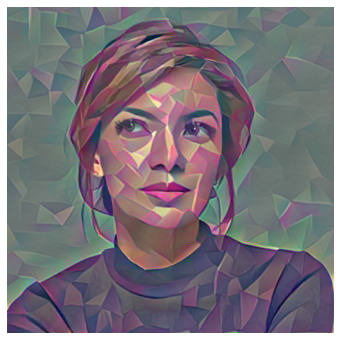

Epoch:  2400 | Loss: 4.95043


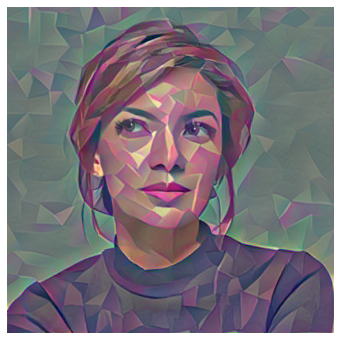

Epoch:  2500 | Loss: 4.99823


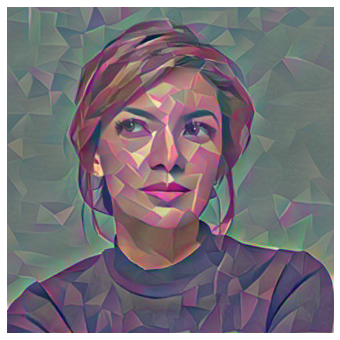

Epoch:  2600 | Loss: 4.88254


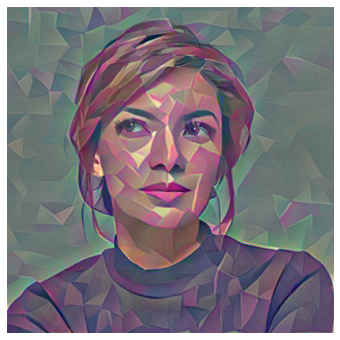

Epoch:  2700 | Loss: 5.27689


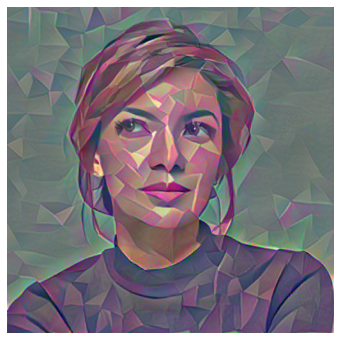

Epoch:  2800 | Loss: 4.84892


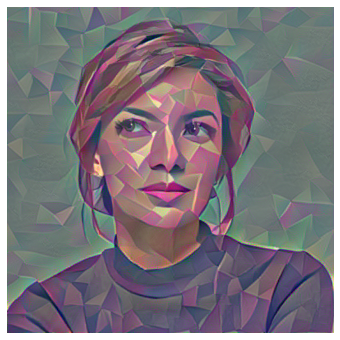

Epoch:  2900 | Loss: 6.21737


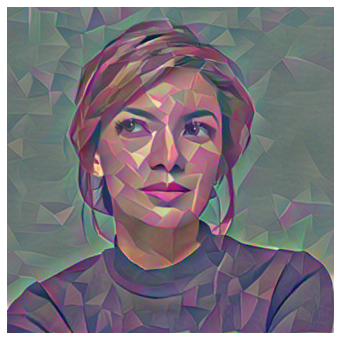

Epoch:  3000 | Loss: 4.76326


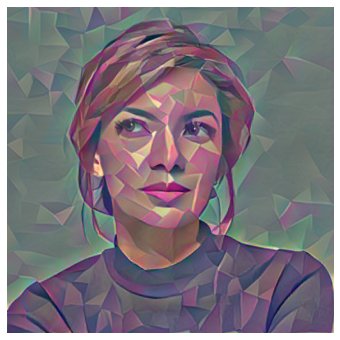

Epoch:  3100 | Loss: 5.29708


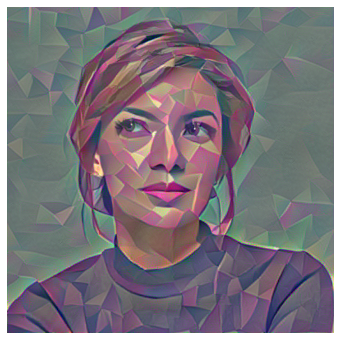

Epoch:  3200 | Loss: 5.03274


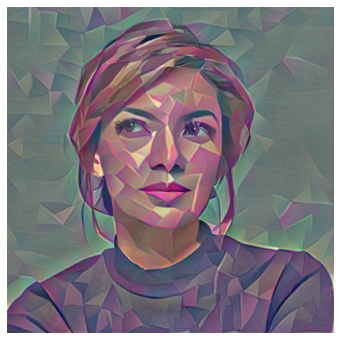

Epoch:  3300 | Loss: 4.84101


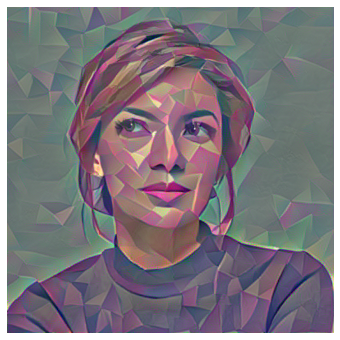

Epoch:  3400 | Loss: 5.13146


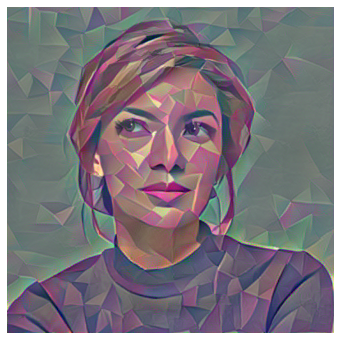

Epoch:  3500 | Loss: 4.84638


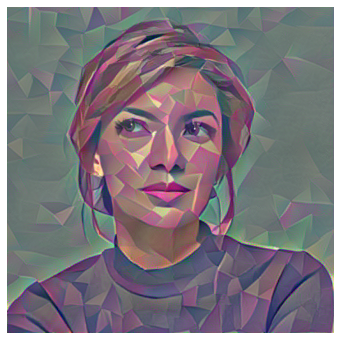

Epoch:  3600 | Loss: 5.78762


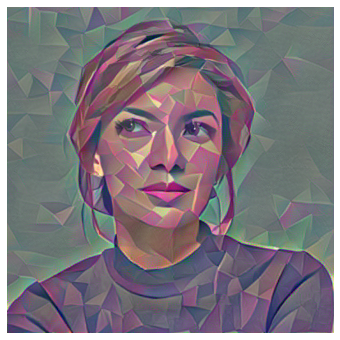

Epoch:  3700 | Loss: 4.80731


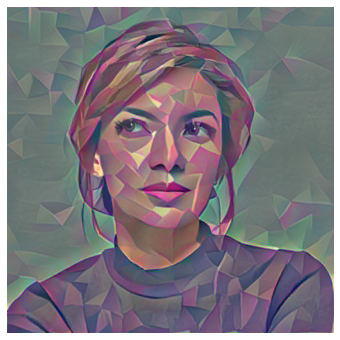

Epoch:  3800 | Loss: 5.27945


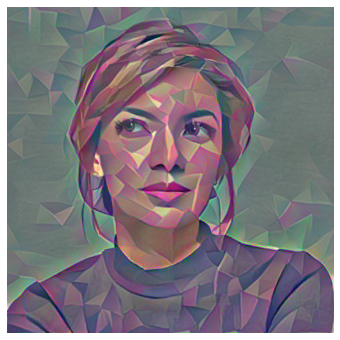

Epoch:  3900 | Loss: 5.09222


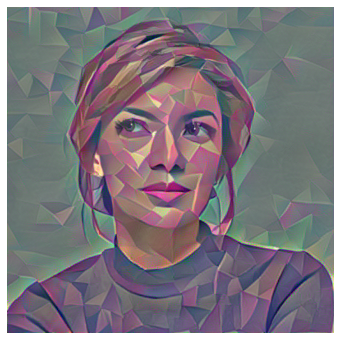

Epoch:  4000 | Loss: 5.08931


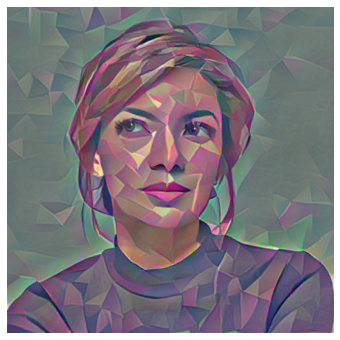

Epoch:  4100 | Loss: 5.40205


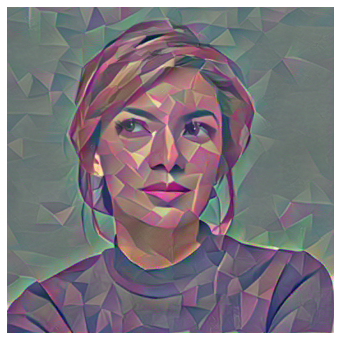

Epoch:  4200 | Loss: 4.80047


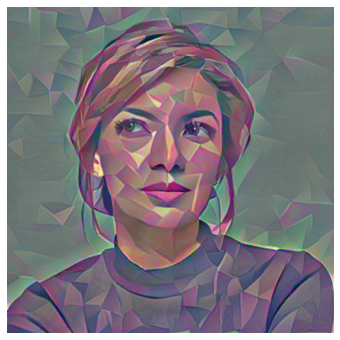

Epoch:  4300 | Loss: 6.07130


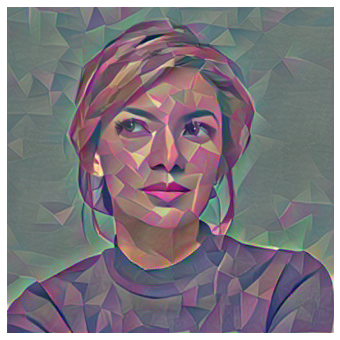

Epoch:  4400 | Loss: 4.77463


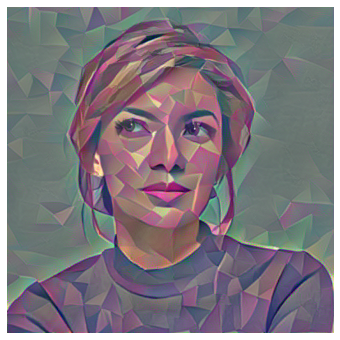

Epoch:  4500 | Loss: 5.78727


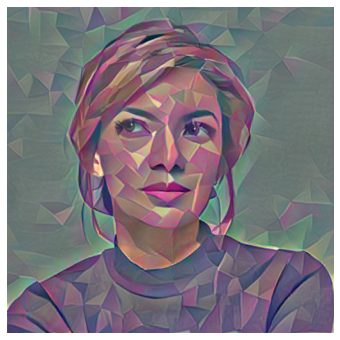

Epoch:  4600 | Loss: 4.79695


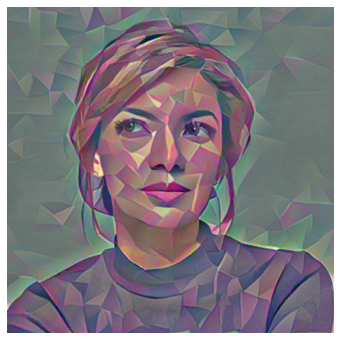

Epoch:  4700 | Loss: 5.99507


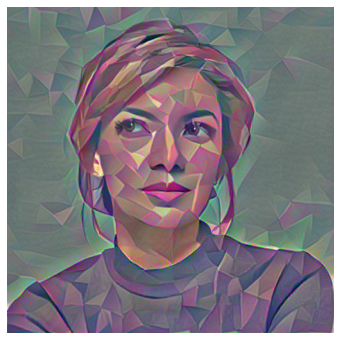

Epoch:  4800 | Loss: 4.85784


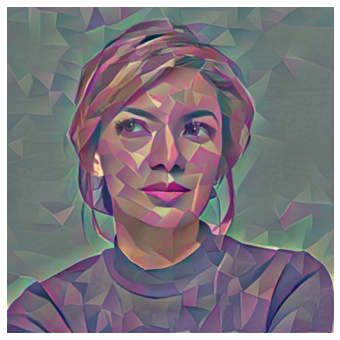

Epoch:  4900 | Loss: 5.08591


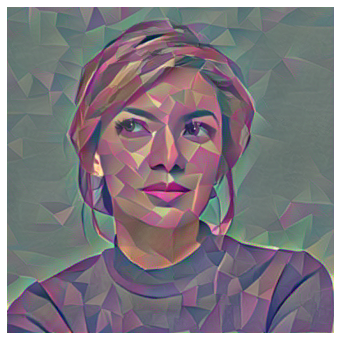

Epoch:  5000 | Loss: 5.12535


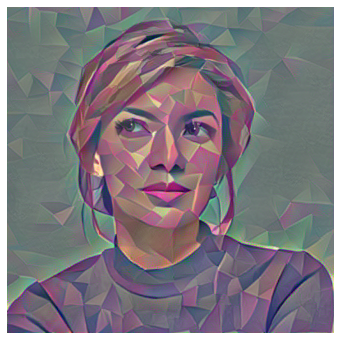

In [12]:
max_epochs = 5000
for epoch in range(1, max_epochs+1):
    output_features = model(output, layers=["4", "8", "13"])
    loss = criterion(content_features, style_features, output_features[:2], output_features[1:], style_weight=1e6)
    loss.backward()
    
    optimizer.step()
    optimizer.zero_grad()
    
    if epoch % 100 == 0:
        print(f"Epoch: {epoch:5} | Loss: {loss.item():.5f}")
        _ = draw_styled_image(output)